## Setup


In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
#!conda activate gnngeometry

In [3]:
import torch
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import math, random, torch, collections, time, torch.nn.functional as F, networkx as nx, matplotlib.pyplot as plt, numpy as np
from torch.nn import Linear
from torch_geometric.nn import GCNConv
from IPython.display import clear_output
from torch_geometric.utils import to_networkx
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from functools import wraps

# Helper function for visualization.
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def visualize(h, color):
    z = TSNE(n_components=2).fit_transform(out.detach().cpu().numpy())
    plt.figure(figsize=(10,10))
    plt.xticks([])
    plt.yticks([])

    plt.scatter(z[:, 0], z[:, 1], s=70, c=color, cmap="Set2")
    plt.show()

## Generate Closed Helix

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import random
import math
import torch
from sklearn.neighbors import kneighbors_graph
import scipy as sc
import sklearn as sk
from sklearn.preprocessing import StandardScaler
import torch
from torch_geometric.data import Data
from torch_geometric.utils import from_scipy_sparse_matrix, to_undirected

def generate_sphere(r=1, alpha = 1, beta = 1, seed = 1234, n_samples = 3000, n_neighbours = 5, features = 'coordinates', standardize=True):
  random.seed(1234)
  theta = 2 * math.pi * np.random.beta(a = alpha,b = beta, size= n_samples)
  phi =  math.pi * np.random.beta(a = alpha, b = beta, size = n_samples)
  x = r * np.cos(theta) * np.sin(phi)
  y = r * np.sin(theta) * np.sin(phi)
  z = r * np.cos(phi)
  X = np.vstack([np.array(x), np.array(y), np.array(z)]).T
  A = kneighbors_graph(X, n_neighbours, mode='distance', include_self=False)
  edge_index, edge_weights = from_scipy_sparse_matrix(A)
  edge_index, edge_weights = to_undirected(edge_index, edge_weights)
  if standardize:
      preproc = StandardScaler()
      X = preproc.fit_transform(X)
  if features == 'coordinates':
      new_data = Data(x=torch.from_numpy(X).float(),
                      edge_index=edge_index,
                      edge_weight=edge_weights)
  else:
      new_data = Data(x=torch.eye(n_samples), edge_index=edge_index,
                      edge_weight=edge_weights)
  return x,y,z, A, new_data

In [5]:
def generate_helix(alpha = 1, beta = 1, seed = 1234, n_samples = 3000, n_neighbours = 5, features = 'coordinates', standardize=True):
  random.seed(1234)
  theta = 8 * math.pi * np.random.beta(a = alpha,b = beta, size= n_samples)
  phi = 4 * math.pi * np.random.beta(a = alpha, b = beta, size = n_samples)
  n =  np.random.uniform(0,1,n_samples)
  #x=(1.2+0.1*np.cos(phi))*np.cos(theta)
  #y=(1.2+0.1*np.cos(phi))*np.sin(theta)
  theta = np.sort(theta)
  x = n*np.cos(theta)
  y = n*np.sin(theta)
  #z=0.1*np.sin(phi)+theta/np.pi
  z = theta/np.pi 
  X = np.vstack([np.array(x), np.array(y), np.array(z)]).T
  A = kneighbors_graph(X, n_neighbours, mode='distance', include_self=False)
  edge_index, edge_weights = from_scipy_sparse_matrix(A)
  edge_index, edge_weights = to_undirected(edge_index, edge_weights)
  if standardize:
      preproc = StandardScaler()
      X = preproc.fit_transform(X)
  if features == 'coordinates':
      new_data = Data(x=torch.from_numpy(X).float(),
                      edge_index=edge_index,
                      edge_weight=edge_weights)
  else:
      new_data = Data(x=torch.eye(n_samples), edge_index=edge_index,
                      edge_weight=edge_weights)
  return x,y,z, A, new_data

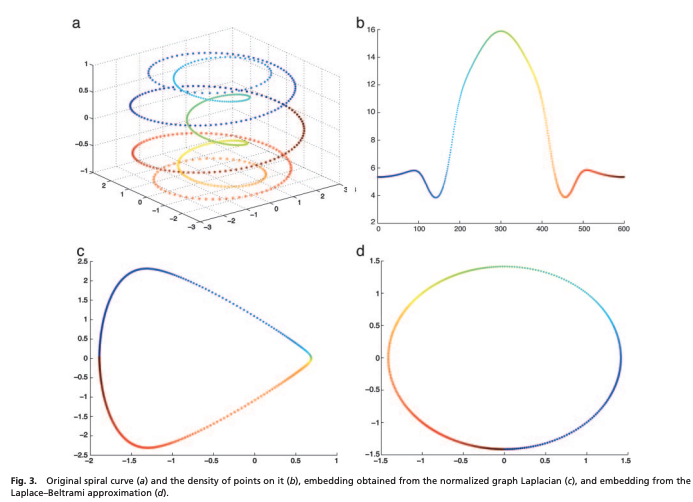

need to generate helix curve rather than spheres?

image.png

reference: https://github.com/goroda/diffusion_maps/blob/main/gendata.py

In [6]:
import argparse
import sys
import numpy as np

def get_vhelix(uniform=True, a = 0.5, b = 0.5, seed = 1234, n_samples = 3000, n_neighbours = 5, features = 'coordinates', standardize=True):
    # plot vertical helix
    # CANNOT REPRODUCE THE COIFMAN PAPER YET
    npts = n_samples
    if uniform is True:
        time = np.linspace(0, 1, npts);
    else:
        np.random.seed(seed)
        time = np.sort(np.random.beta(a, b, size=(npts)))


    height = np.sin(1.0 * np.pi * time)
    radius = np.sin(2.0 * 2.0 * np.pi * time) + 2.0
    x = radius * np.cos(5 * 2 * np.pi * time)
    y = radius * np.sin(5 * 2 * np.pi * time)

    X = np.vstack([np.array(x), np.array(y), np.array(height)]).T
    A = kneighbors_graph(X, n_neighbours, mode='distance', include_self=False)
    edge_index, edge_weights = from_scipy_sparse_matrix(A)
    edge_index, edge_weights = to_undirected(edge_index, edge_weights)
    if standardize:
      preproc = StandardScaler()
      X = preproc.fit_transform(X)
    if features == 'coordinates':
        new_data = Data(x=torch.from_numpy(X).float(),
                        edge_index=edge_index,
                        edge_weight=edge_weights)
    else:
        new_data = Data(x=torch.eye(n_samples), edge_index=edge_index,
                        edge_weight=edge_weights)
    return x,y, height, time, A, new_data

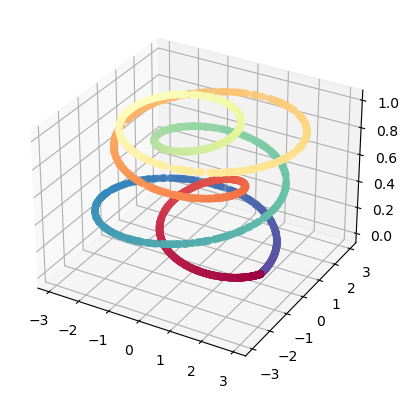

In [7]:
x,y,z,t,_,new_data = get_vhelix(uniform = False)
fig = plt.figure()
ax = plt.axes(projection ='3d')
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)

source: https://rdrr.io/github/kcf-jackson/maniTools/src/R/simulate_data.R

In [8]:
#' Toroidal Helix by Coifman & Lafon
#' @param N integer; Number of datapoints.
#' @param sample_rate numeric; Sampling rate.
#' @export
def toroidal_helix(N, sample_rate = 1.0):
  """
  input: number of samples
  output: data, color
  """
  noiseSigma = 0.05 #noise parameter
  t = np.arange(1,N+1) / N
  t = (t**(sample_rate)) * 2 * np.pi
  noise = noiseSigma * np.random.normal(size = (N,3))
  x =  (2+np.cos(8*t))*np.cos(t) + noiseSigma * np.random.normal(size = N)
  y =  (2+np.cos(8*t))*np.sin(t) + noiseSigma * np.random.normal(size = N) 
  z = np.sin(8*t) +  noiseSigma * np.random.normal(size = N)
  return x,y,z, t

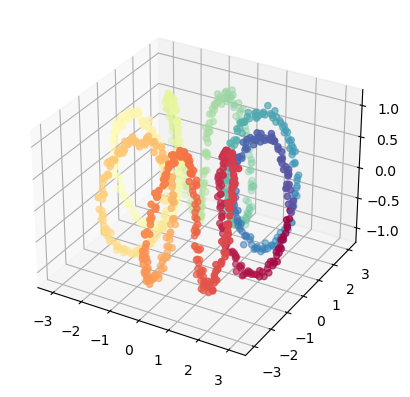

In [9]:
x,y,z,t = toroidal_helix(N= 1000, sample_rate = 1.0)
fig = plt.figure()
ax = plt.axes(projection ='3d')
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)

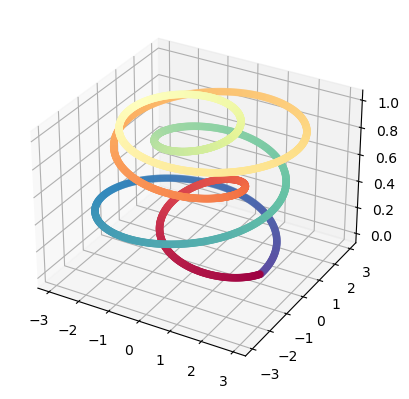

In [10]:
x,y,z,t, A,new_data = get_vhelix(uniform = True)

fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)
#ax.plot(x,y,z)
plt.show()

<Figure size 640x480 with 0 Axes>

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_9427/1736191027.py:2: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A),


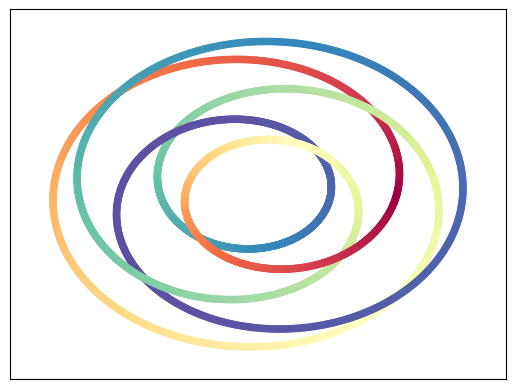

In [11]:
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=z, cmap='Spectral', with_labels=False, node_size = 20)
plt.show()

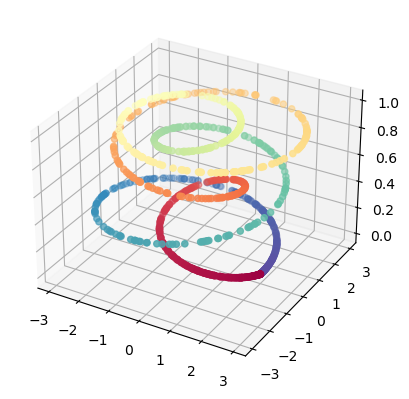

In [12]:
x,y,z,t, A,new_data = get_vhelix(uniform = False, a = 0.5, b = 0.5,n_samples = 1000)

fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)
#ax.plot(x,y,z)
plt.show()

<Figure size 640x480 with 0 Axes>

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_9427/779525772.py:2: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A),


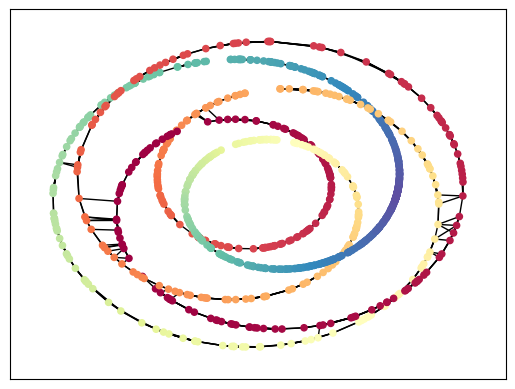

In [13]:
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=z, cmap='Spectral_r', with_labels=False, node_size = 20)
plt.show()

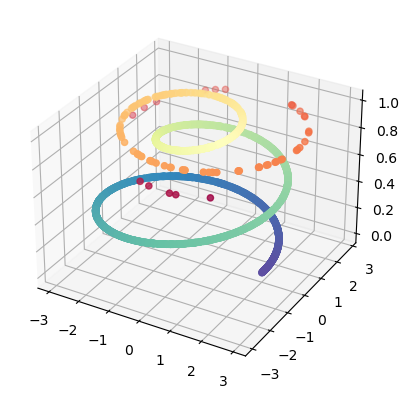

In [14]:
x,y,z,t, A,new_data = get_vhelix(uniform = False, a = 1, b = 5)

fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)
#ax.plot(x,y,z)
plt.show()

<Figure size 640x480 with 0 Axes>

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_9427/3349307350.py:2: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A),


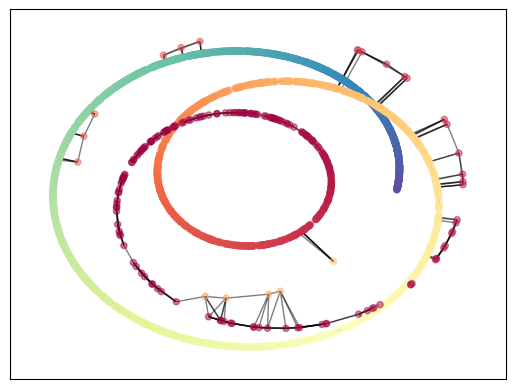

In [15]:
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=z, cmap='Spectral_r', with_labels=False, node_size = 20, alpha = 0.5)
plt.show()

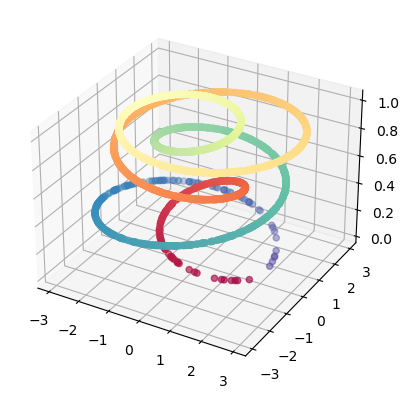

In [16]:
x,y,z,t, A,new_data = get_vhelix(uniform = False, a = 2, b = 2)

fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)
#ax.plot(x,y,z)
plt.show()

<Figure size 640x480 with 0 Axes>

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_9427/779525772.py:2: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A),


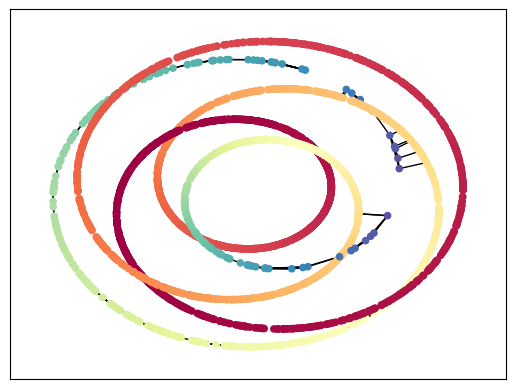

In [17]:
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=z, cmap='Spectral_r', with_labels=False, node_size = 20)
plt.show()

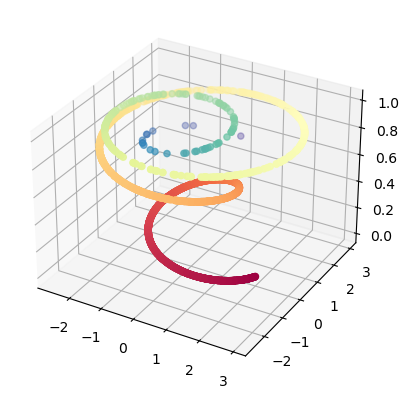

In [18]:
x,y,z,t, A,new_data = get_vhelix(uniform = False, a = 5, b = 1)

fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)
#ax.plot(x,y,z)
plt.show()

<Figure size 640x480 with 0 Axes>

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_9427/779525772.py:2: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A),


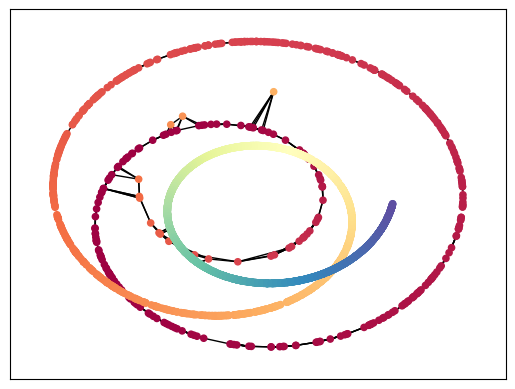

In [19]:
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=z, cmap='Spectral_r', with_labels=False, node_size = 20)
plt.show()

In [20]:
cd /Users/sowonjeong/Documents/GitHub/GNN-Geometry

/Users/sowonjeong/Documents/GitHub/GNN-Geometry


In [21]:
from models.dgi import *
from models.train_models import train_dgi
from models.baseline_models import *

In [22]:
cd /Users/sowonjeong/Documents/GitHub/GNN-Geometry/notebook

/Users/sowonjeong/Documents/GitHub/GNN-Geometry/notebook


## Embeddings across $\alpha$

In [23]:
x,y,z,t,_,dataset = get_vhelix(uniform = False, a = 0.5, b = 0.5, n_samples = 1500)

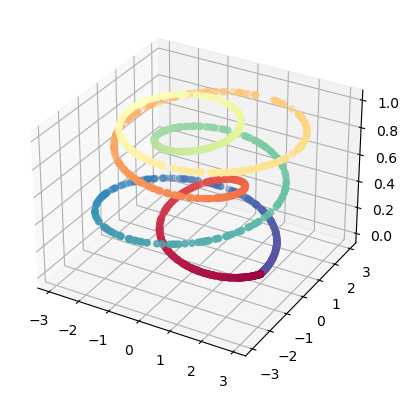

In [24]:
fig = plt.figure()
ax = plt.axes(projection ='3d')

# plotting
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t)
#ax.plot(x,y,z)
plt.show()

In [25]:
from scipy.special import beta, gamma
from numpy import linspace, exp
def beta_density_plot(a=1, b =1, n_samples = 500):
    x = linspace(.01, .99, n_samples)
    a = a
    b = b
    y = (1 / beta(a, b)) * x ** (a - 1) * (1 - x) ** (b - 1)
    # plt.figure(figsize = (12,8))
    plt.scatter(x,y, cmap = plt.cm.Spectral_r, c = x, s = 10)
    plt.show()

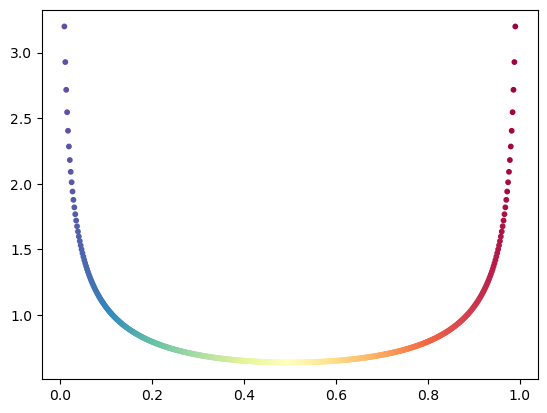

In [26]:
beta_density_plot(a=0.5, b = 0.5)

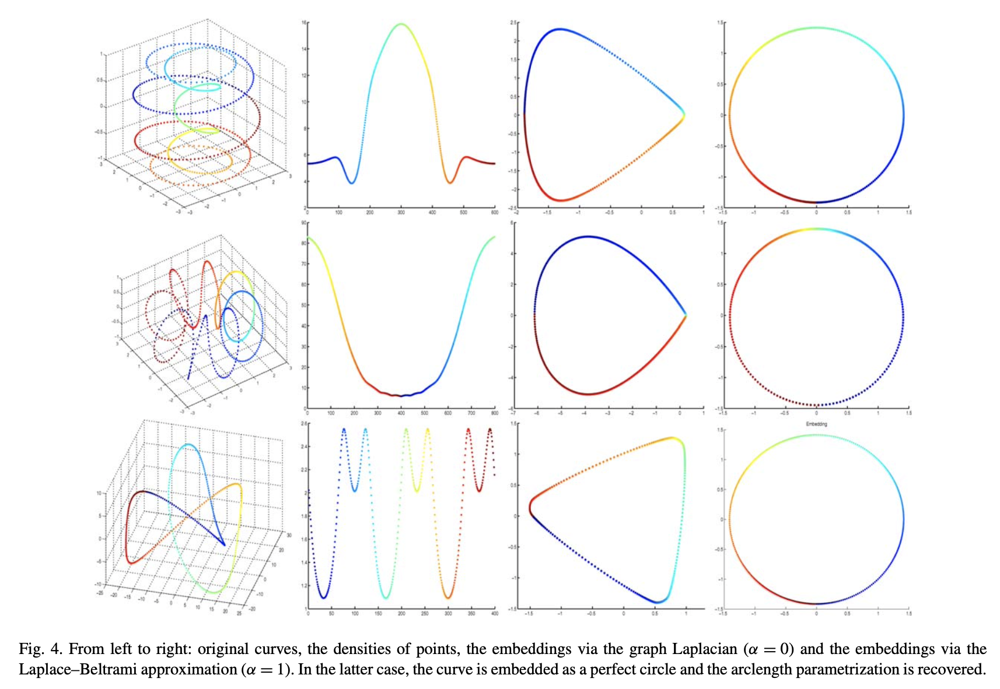

In [26]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_dgi(dataset,hid_dim = 32, out_dim = 2, n_layers = 2, patience=50,
              epochs=500, lr=1e-2, name_file="1", device=None, alpha = alpha[i], beta = 1, add_self_loops = True, dropout_rate = 0.01)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train DGI model ===
Epoch=000, loss=4.5204, time=0.1815
Epoch=001, loss=2.0886, time=0.0168
Epoch=002, loss=0.8189, time=0.0182
Epoch=003, loss=0.6903, time=0.0145
Epoch=004, loss=0.6929, time=0.0139
Epoch=005, loss=0.6934, time=0.0129
Epoch=006, loss=0.6935, time=0.0130
Epoch=007, loss=0.6935, time=0.0101
Epoch=008, loss=0.6934, time=0.0112
Epoch=009, loss=0.6934, time=0.0118
Epoch=010, loss=0.6935, time=0.0103
Epoch=011, loss=0.6935, time=0.0133
Epoch=012, loss=0.6935, time=0.0109
Epoch=013, loss=0.6935, time=0.0115
Epoch=014, loss=0.6935, time=0.0111
Epoch=015, loss=0.6935, time=0.0124
Epoch=016, loss=0.6935, time=0.0121
Epoch=017, loss=0.6935, time=0.0130
Epoch=018, loss=0.6935, time=0.0116
Epoch=019, loss=0.6935, time=0.0146
Epoch=020, loss=0.6935, time=0.0121
Epoch=021, loss=0.6935, time=0.0130
Epoch=022, loss=0.6935, time=0.0121
Epoch=023, loss=0.6934, time=0.0169
Epoch=024, loss=0.6934, time=0.0141
Epoch=025, loss=0.6934, time=0.0150
Epoch=026, loss=0.6934, time=0.0142
Epoc

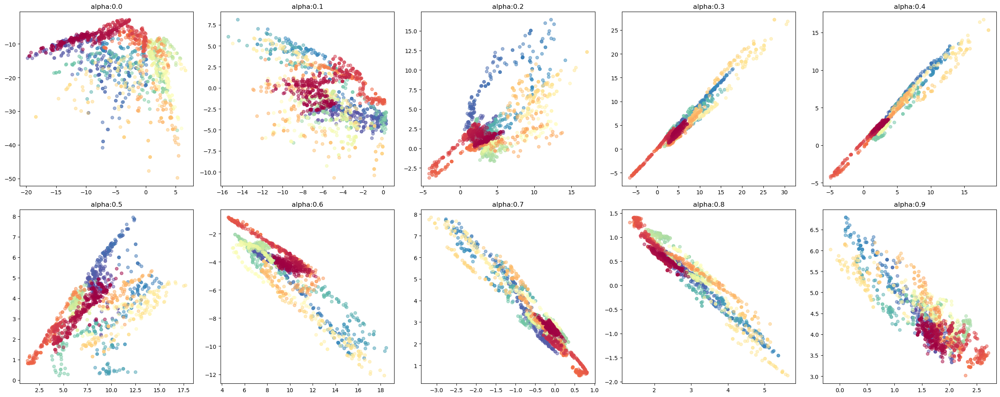

In [27]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

In [28]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_dgi(dataset,hid_dim = 32, out_dim = 2, n_layers = 2, patience=50,
              epochs=500, lr=1e-2, name_file="1", device=None, gnn_type = 'RW', 
              alpha = alpha[i], beta = 1, add_self_loops = True, dropout_rate = 0.01)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train DGI model ===
Epoch=000, loss=0.7092, time=0.0195
Epoch=001, loss=0.6997, time=0.0150
Epoch=002, loss=0.6911, time=0.0227
Epoch=003, loss=0.6833, time=0.0122
Epoch=004, loss=0.6753, time=0.0118
Epoch=005, loss=0.6684, time=0.0240
Epoch=006, loss=0.6602, time=0.0112
Epoch=007, loss=0.6537, time=0.0115
Epoch=008, loss=0.6441, time=0.0206
Epoch=009, loss=0.6371, time=0.0116
Epoch=010, loss=0.6303, time=0.0095
Epoch=011, loss=0.6182, time=0.0124
Epoch=012, loss=0.6111, time=0.0154
Epoch=013, loss=0.5973, time=0.0129
Epoch=014, loss=0.5933, time=0.0122
Epoch=015, loss=0.5784, time=0.0109
Epoch=016, loss=0.5621, time=0.0111
Epoch=017, loss=0.5584, time=0.0124
Epoch=018, loss=0.5468, time=0.0118
Epoch=019, loss=0.5321, time=0.0101
Epoch=020, loss=0.5166, time=0.0131
Epoch=021, loss=0.5131, time=0.0130
Epoch=022, loss=0.4958, time=0.0121
Epoch=023, loss=0.4858, time=0.0119
Epoch=024, loss=0.4828, time=0.0099
Epoch=025, loss=0.4736, time=0.0117
Epoch=026, loss=0.4589, time=0.0129
Epoc

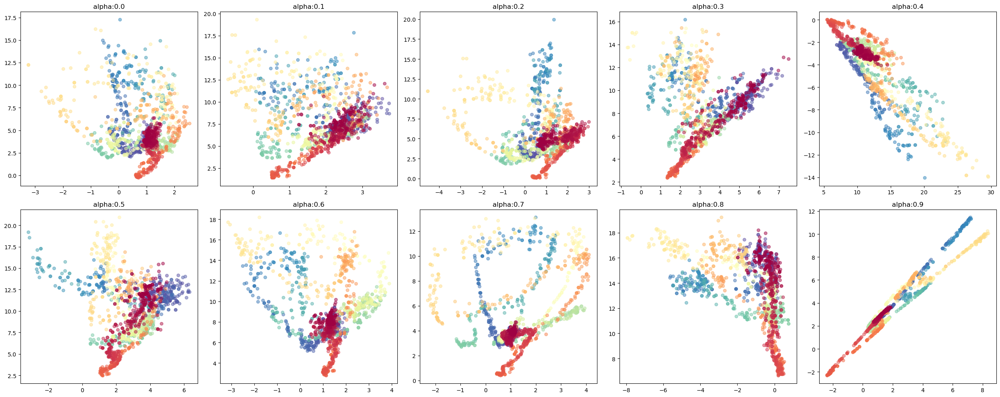

In [29]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

In [124]:
from models.grace import *
from models.train_models import train_grace
from models.baseline_models import *

In [135]:
out = {}
alpha = np.arange(0.1,1.1,0.1)
for i in np.arange(10):
    model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                proj="nonlinear-hid", name_file="test", device=None,
                gnn_type="symmetric", alpha=alpha[i], beta = 1,add_self_loops= True)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp


=== train GRACE model ===
Epoch=000, loss=7.9117
Epoch=001, loss=7.4075
Epoch=002, loss=8.4950
Epoch=003, loss=7.2388
Epoch=004, loss=7.7589
Epoch=005, loss=8.5802
Epoch=006, loss=7.9517
Epoch=007, loss=8.2199
Epoch=008, loss=7.6484
Epoch=009, loss=7.5775
Epoch=010, loss=7.5712
Epoch=011, loss=7.9199
Epoch=012, loss=7.2480
Epoch=013, loss=7.2486
Epoch=014, loss=7.4538
Epoch=015, loss=8.2100
Epoch=016, loss=8.6050
Epoch=017, loss=7.8477
Epoch=018, loss=8.0504
Epoch=019, loss=7.9795
Epoch=020, loss=8.1328
Epoch=021, loss=7.1440
Epoch=022, loss=7.1147
Epoch=023, loss=7.6611
Epoch=024, loss=7.6164
Epoch=025, loss=7.0534
Epoch=026, loss=8.6638
Epoch=027, loss=7.0351
Epoch=028, loss=8.0916
Epoch=029, loss=7.6795
Epoch=030, loss=7.0017
Epoch=031, loss=7.5571
Epoch=032, loss=7.5691
Epoch=033, loss=6.9858
Epoch=034, loss=8.0015
Epoch=035, loss=8.7492
Epoch=036, loss=7.5346
Epoch=037, loss=8.0417
Epoch=038, loss=8.0258
Epoch=039, loss=7.3456
Epoch=040, loss=6.9065
Epoch=041, loss=7.9225
Epoch=04

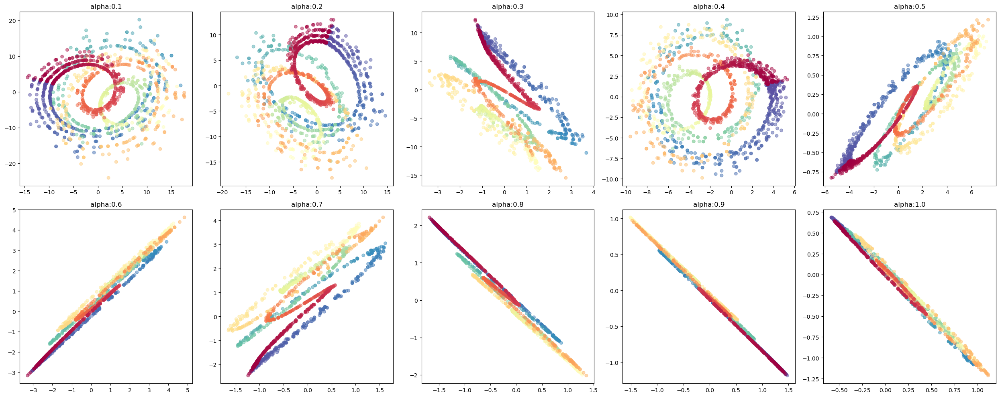

In [136]:
# symmetric
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

In [137]:
grace_symm_out = out

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.594444,0.604667,0.513778,0.635778,0.489556,0.472000,0.597556,0.502444,0.455333,0.553111,3
1,0.291467,0.311267,0.260600,0.357600,0.256533,0.254467,0.337133,0.276000,0.251067,0.306867,10
2,0.196400,0.203367,0.157700,0.225933,0.163200,0.158367,0.210867,0.179367,0.171567,0.194000,20
3,0.099253,0.102000,0.082973,0.107880,0.084387,0.086667,0.099627,0.094880,0.092347,0.095853,50
4,0.055667,0.056100,0.048387,0.057160,0.049387,0.050307,0.053153,0.052933,0.053947,0.054960,100


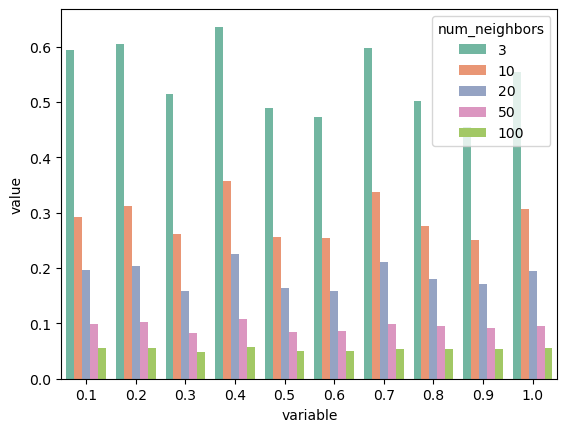

In [144]:
knn_eval_plot(out)

In [150]:
from metrics import *
res = torch.zeros((10,3))
for i in range(10):
    res[i,0] = alpha[i]
    _,_,res[i,1], _ = spearman_correlation_eval(dataset.x, out[i])
    _,_,res[i,2], _ = kendall_tau_correlation_eval(dataset.x, out[i])  
df = pd.DataFrame(res) 
df.columns = ['alpha', 'spearman','kendall_tau']

<AxesSubplot:xlabel='alpha', ylabel='value'>

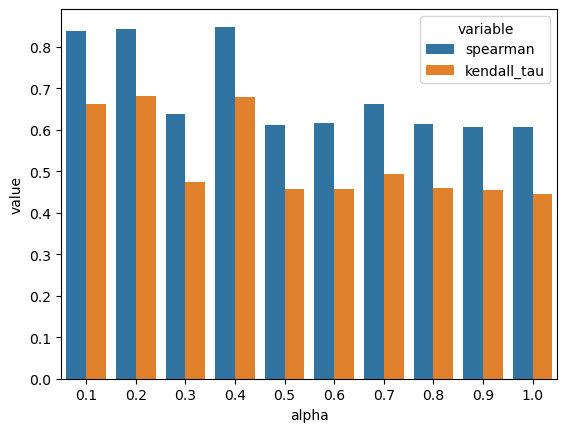

In [151]:
df_unpivot = pd.melt(df, id_vars = 'alpha', value_vars = ['spearman', 'kendall_tau'])
sns.barplot(df_unpivot, x = 'alpha', y = 'value', hue = 'variable')

In [152]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                proj="nonlinear-hid", name_file="test", device=None,
                gnn_type="RW", alpha=alpha[i], beta = 1,add_self_loops= True)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train GRACE model ===
Epoch=000, loss=7.9805
Epoch=001, loss=7.9334
Epoch=002, loss=7.9801
Epoch=003, loss=7.7885
Epoch=004, loss=7.7378
Epoch=005, loss=7.3310
Epoch=006, loss=8.1848
Epoch=007, loss=7.7066
Epoch=008, loss=7.3299
Epoch=009, loss=7.3413
Epoch=010, loss=7.3274
Epoch=011, loss=7.9729
Epoch=012, loss=7.2729
Epoch=013, loss=7.8976
Epoch=014, loss=8.1000
Epoch=015, loss=7.2509
Epoch=016, loss=7.7866
Epoch=017, loss=7.2650
Epoch=018, loss=7.7659
Epoch=019, loss=7.3950
Epoch=020, loss=7.3596
Epoch=021, loss=8.1187
Epoch=022, loss=7.7115
Epoch=023, loss=7.2819
Epoch=024, loss=7.6938
Epoch=025, loss=7.2947
Epoch=026, loss=7.6316
Epoch=027, loss=7.5877
Epoch=028, loss=7.2189
Epoch=029, loss=8.2459
Epoch=030, loss=7.4754
Epoch=031, loss=7.1779
Epoch=032, loss=7.3922
Epoch=033, loss=8.0652
Epoch=034, loss=7.1481
Epoch=035, loss=8.1273
Epoch=036, loss=8.7463
Epoch=037, loss=7.1573
Epoch=038, loss=7.1650
Epoch=039, loss=8.2333
Epoch=040, loss=8.5926
Epoch=041, loss=8.0638
Epoch=04

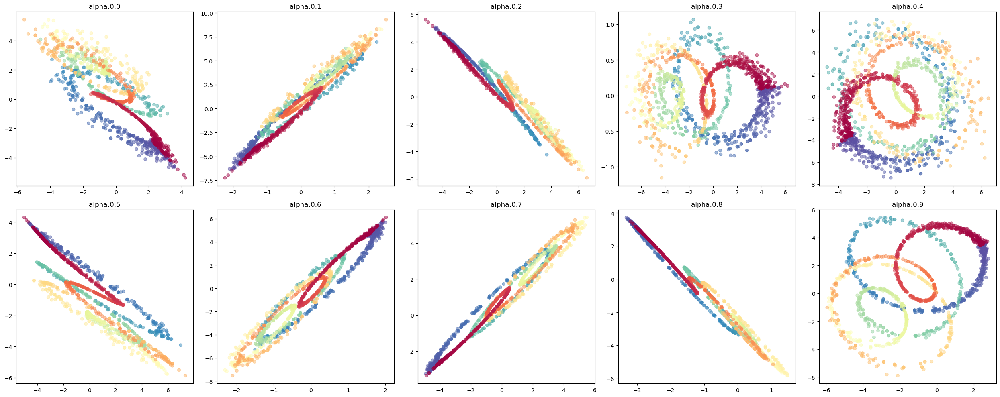

In [153]:
# row-normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.489778,0.412000,0.457111,0.496000,0.592444,0.506222,0.506667,0.540444,0.532222,0.793111,3
1,0.233533,0.192933,0.221933,0.254933,0.336667,0.283000,0.268333,0.298133,0.291867,0.473933,10
2,0.151367,0.120233,0.139900,0.161000,0.217867,0.176300,0.172267,0.192400,0.180733,0.268467,20
3,0.081267,0.064773,0.073173,0.084760,0.105880,0.091320,0.089440,0.095693,0.091347,0.114520,50
4,0.047827,0.040853,0.044767,0.048493,0.056920,0.050860,0.050240,0.052373,0.051947,0.058327,100


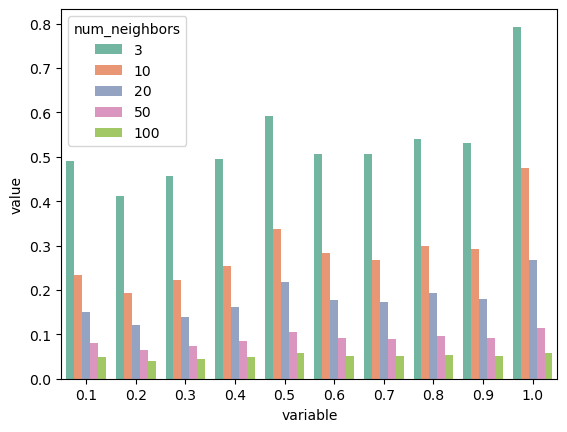

In [156]:
knn_eval_plot(out)

<AxesSubplot:xlabel='alpha', ylabel='value'>

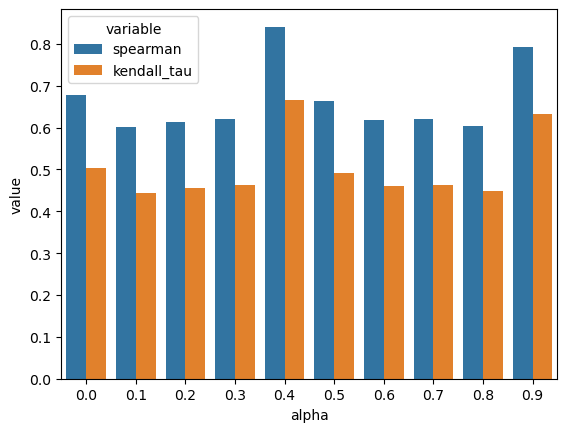

In [157]:
res = torch.zeros((10,3))
for i in range(10):
    res[i,0] = alpha[i]
    _,_,res[i,1], _ = spearman_correlation_eval(dataset.x, out[i])
    _,_,res[i,2], _ = kendall_tau_correlation_eval(dataset.x, out[i])  
df = pd.DataFrame(res) 
df.columns = ['alpha', 'spearman','kendall_tau']
df_unpivot = pd.melt(df, id_vars = 'alpha', value_vars = ['spearman', 'kendall_tau'])
sns.barplot(df_unpivot, x = 'alpha', y = 'value', hue = 'variable')

### cca-ssg

In [26]:
from models.cca_ssg import *
from models.train_models import train_cca_ssg
from models.baseline_models import *

In [27]:
out = {}
alpha = np.arange(0.1,1.1,0.1)
for i in np.arange(10):
    model = train_cca_ssg(dataset,  32, 2, lambd=1e-5,
                  n_layers=2, epochs=200, lr=1e-3,
                  fmr=0.2, edr =0.5, name_file="test",
                 gnn_type= 'symmetric',
                  alpha=alpha[i],beta =1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===


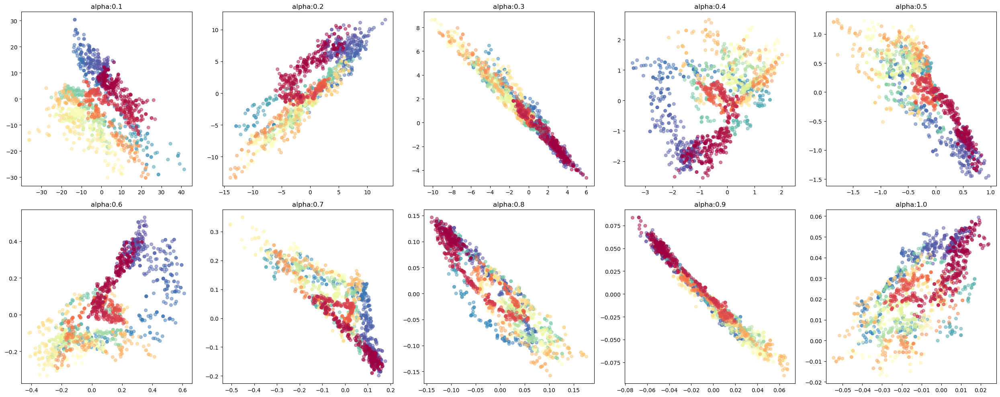

In [28]:
# symmetric
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

In [30]:
cd ../

/Users/sowonjeong/Documents/GitHub/GNN-Geometry


,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.397333,0.350889,0.351778,0.455111,0.384889,0.429778,0.420667,0.426444,0.317333,0.406889,3
1,0.226867,0.194133,0.191533,0.270200,0.224200,0.251733,0.253000,0.252267,0.173933,0.244000,10
2,0.159033,0.136933,0.132633,0.183767,0.158333,0.170700,0.177733,0.170400,0.122033,0.174867,20
3,0.089453,0.081853,0.074040,0.097573,0.089733,0.094933,0.096093,0.090840,0.071800,0.096947,50
4,0.053280,0.049793,0.046607,0.054887,0.052653,0.054413,0.053860,0.052693,0.045927,0.054973,100


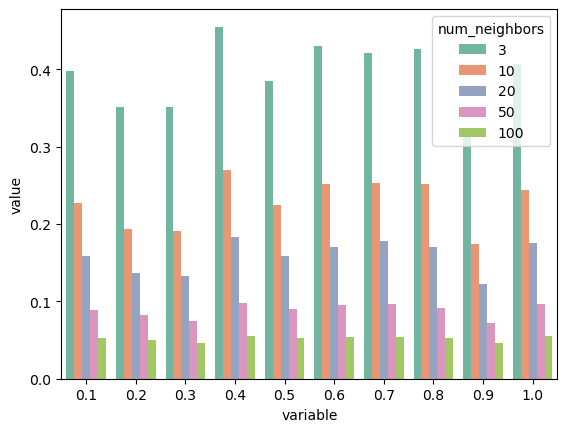

In [31]:
from metrics import *
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.661765,0.479157
1,0.2,0.586216,0.420344
2,0.3,0.565605,0.405847
3,0.4,0.726828,0.548958
4,0.5,0.622257,0.451970
5,0.6,0.640573,0.462339
6,0.7,0.630065,0.450813
7,0.8,0.551863,0.392930
8,0.9,0.523539,0.377356
9,1.0,0.703149,0.514599


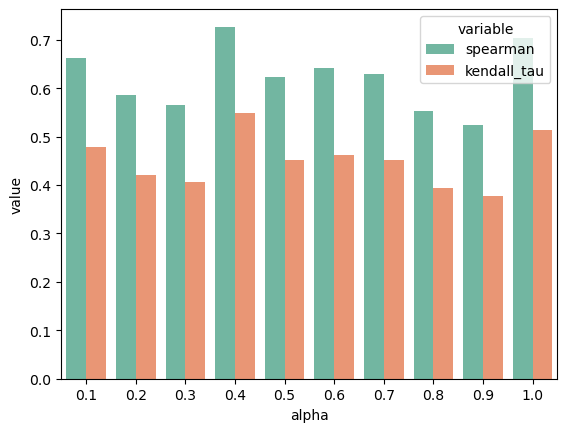

In [32]:
corr_eval_plot(dataset, out)

In [33]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_cca_ssg(dataset,  32, 2, lambd=1e-5,
                  n_layers=2, epochs=200, lr=1e-3,
                  fmr=0.2, edr =0.5, name_file="test",
                 gnn_type= 'RW',
                  alpha=alpha[i],beta =1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===
=== train CCA model model ===


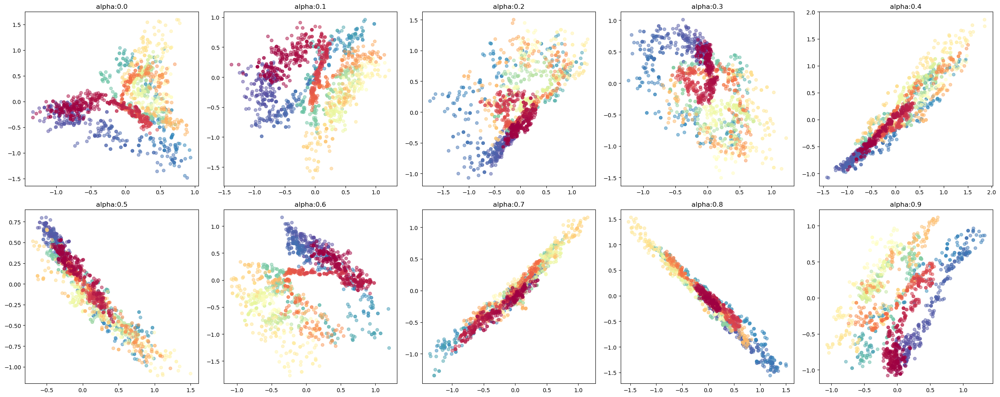

In [34]:
# row_normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.350222,0.382000,0.383556,0.419778,0.381778,0.321778,0.422667,0.342889,0.364444,0.458889,3
1,0.199800,0.218933,0.219467,0.252933,0.220867,0.166600,0.261667,0.185733,0.205600,0.277067,10
2,0.139100,0.156967,0.155200,0.178267,0.152467,0.119667,0.179733,0.123900,0.146867,0.197433,20
3,0.083547,0.091373,0.086813,0.097800,0.084533,0.073867,0.098493,0.072867,0.082933,0.103400,50
4,0.050440,0.054047,0.051900,0.055353,0.049733,0.047267,0.055460,0.045747,0.050227,0.056453,100


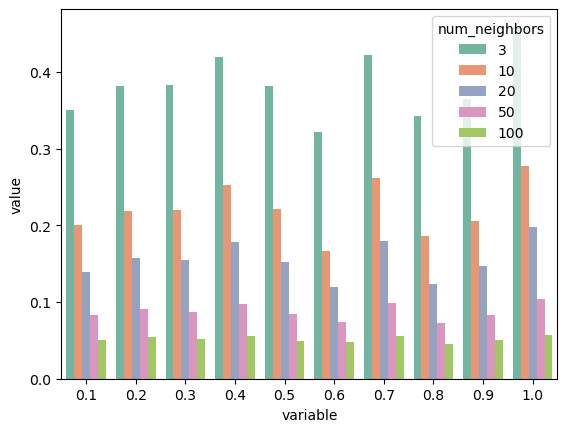

In [36]:
knn_eval_plot(dataset, out)

,alpha,spearman,kendall_tau
0,0.1,0.701386,0.514213
1,0.2,0.708637,0.527294
2,0.3,0.646154,0.470048
3,0.4,0.704095,0.524004
4,0.5,0.565139,0.405730
5,0.6,0.557337,0.398375
6,0.7,0.688913,0.503630
7,0.8,0.331824,0.232194
8,0.9,0.421506,0.303928
9,1.0,0.712324,0.527306


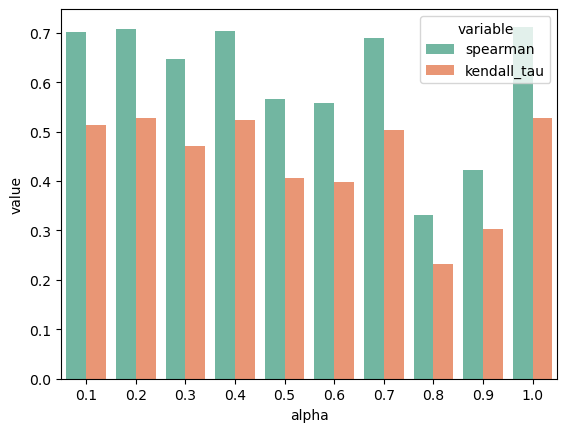

In [37]:
corr_eval_plot(dataset, out)

### BGRL

In [117]:
from models.bgrl import *
from models.train_models import train_bgrl
from models.baseline_models import *

In [118]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_bgrl(dataset, 32,2, lambd=1e-5,
                  n_layers=2, epochs=100, lr=1e-3,
                  fmr=0.2, edr =0.5, pred_hid=512, wd=1e-5,
                  drf1=0.2, drf2=0.2, dre1=0.4, dre2=0.4, name_file="test",
                  dropout_rate = 0.5,gnn_type = 'symmetric',
                  alpha=alpha[i],beta=1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train BGRL model ===
Epoch=000, loss=1.8095
Epoch=001, loss=1.7009
Epoch=002, loss=1.8162
Epoch=003, loss=1.7756
Epoch=004, loss=1.8003
Epoch=005, loss=1.7841
Epoch=006, loss=1.9119
Epoch=007, loss=1.7282
Epoch=008, loss=1.9082
Epoch=009, loss=1.7562
Epoch=010, loss=1.8236
Epoch=011, loss=2.3452
Epoch=012, loss=1.5647
Epoch=013, loss=1.6755
Epoch=014, loss=1.8491
Epoch=015, loss=1.7870
Epoch=016, loss=1.4551
Epoch=017, loss=1.6070
Epoch=018, loss=1.6040
Epoch=019, loss=1.4295
Epoch=020, loss=1.6513
Epoch=021, loss=1.6447
Epoch=022, loss=1.4991
Epoch=023, loss=1.5940
Epoch=024, loss=1.5393
Epoch=025, loss=1.5235
Epoch=026, loss=1.3838
Epoch=027, loss=1.4869
Epoch=028, loss=1.3236
Epoch=029, loss=1.2991
Epoch=030, loss=1.2640
Epoch=031, loss=1.2477
Epoch=032, loss=1.4101
Epoch=033, loss=1.3357
Epoch=034, loss=1.2715
Epoch=035, loss=1.2787
Epoch=036, loss=1.3450
Epoch=037, loss=1.1717
Epoch=038, loss=1.3212
Epoch=039, loss=1.1944
Epoch=040, loss=1.1783
Epoch=041, loss=1.2055
Epoch=042

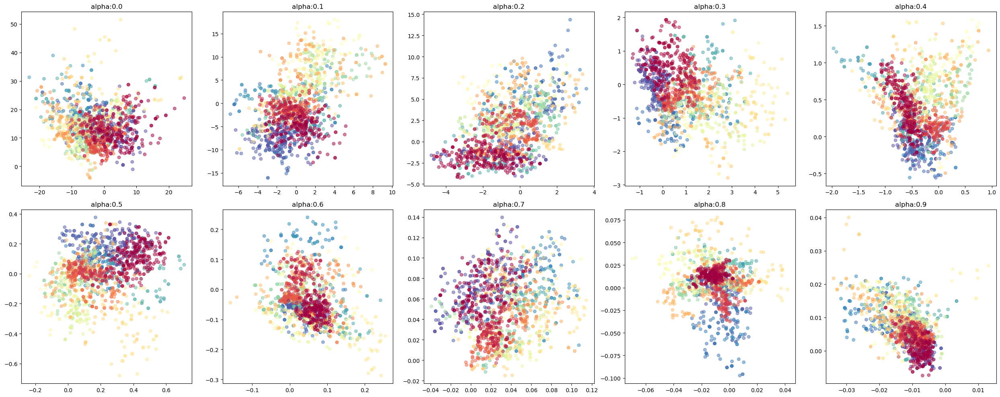

In [119]:
# symmetric
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.266667,0.296000,0.289778,0.304222,0.300667,0.284667,0.299111,0.277333,0.312444,0.281778,3
1,0.122667,0.139733,0.146667,0.164933,0.146200,0.139933,0.146400,0.133133,0.169733,0.131067,10
2,0.080700,0.098533,0.105100,0.119767,0.102333,0.096433,0.101900,0.097600,0.122067,0.088700,20
3,0.048933,0.062667,0.065453,0.073813,0.062493,0.060253,0.062107,0.060040,0.072387,0.052813,50
4,0.033573,0.040713,0.042687,0.047180,0.040513,0.040087,0.040393,0.039567,0.044460,0.035293,100


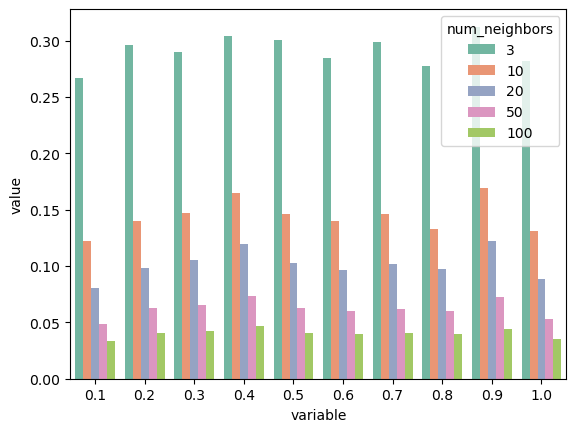

In [120]:
knn_eval_plot(out)

In [121]:
out = {}
alpha = np.arange(0.0,1.1,0.1)
for i in np.arange(10):
    model = train_bgrl(dataset, 32,2, lambd=1e-5,
                  n_layers=2, epochs=100, lr=1e-3,
                  fmr=0.2, edr =0.5, pred_hid=512, wd=1e-5,
                  drf1=0.2, drf2=0.2, dre1=0.4, dre2=0.4, name_file="test",
                  dropout_rate = 0.5,gnn_type = 'RW',
                  alpha=alpha[i],beta=1. ,add_self_loops = True,
                  device=None)
    out_tmp = model.get_embedding(dataset)
    out[i] = out_tmp

=== train BGRL model ===
Epoch=000, loss=3.3088
Epoch=001, loss=3.1319
Epoch=002, loss=2.8924
Epoch=003, loss=3.4988
Epoch=004, loss=3.3310
Epoch=005, loss=3.4795
Epoch=006, loss=3.4820
Epoch=007, loss=3.4168
Epoch=008, loss=3.4703
Epoch=009, loss=3.4506
Epoch=010, loss=3.3397
Epoch=011, loss=3.2993
Epoch=012, loss=3.3868
Epoch=013, loss=3.2249
Epoch=014, loss=3.3399
Epoch=015, loss=3.4312
Epoch=016, loss=3.2829
Epoch=017, loss=3.4507
Epoch=018, loss=3.2662
Epoch=019, loss=3.4567
Epoch=020, loss=3.1352
Epoch=021, loss=3.2207
Epoch=022, loss=1.9597
Epoch=023, loss=3.2271
Epoch=024, loss=3.4400
Epoch=025, loss=2.8579
Epoch=026, loss=3.2299
Epoch=027, loss=3.1111
Epoch=028, loss=3.2600
Epoch=029, loss=3.2792
Epoch=030, loss=3.3268
Epoch=031, loss=3.3365
Epoch=032, loss=3.3902
Epoch=033, loss=3.3063
Epoch=034, loss=3.1564
Epoch=035, loss=3.3378
Epoch=036, loss=3.3072
Epoch=037, loss=3.2458
Epoch=038, loss=3.3469
Epoch=039, loss=3.3623
Epoch=040, loss=2.9845
Epoch=041, loss=3.3606
Epoch=042

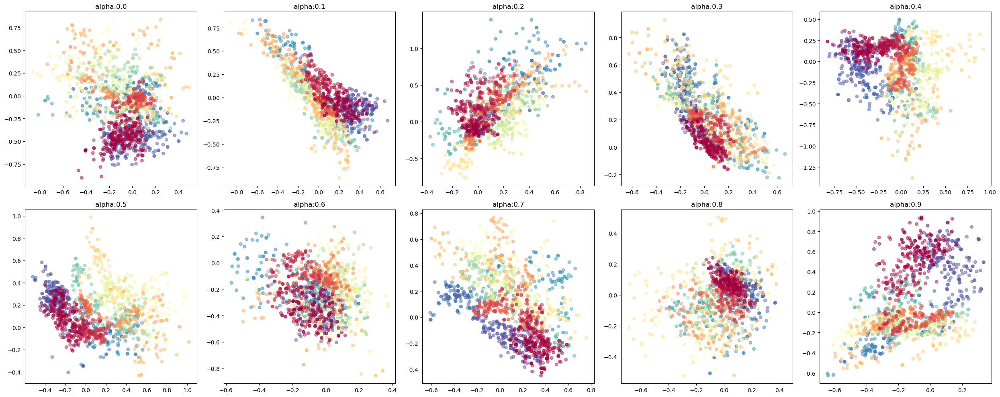

In [122]:
# row_normalized
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i],1)))
plt.tight_layout()
plt.show()

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,num_neighbors
0,0.309111,0.295111,0.335556,0.289111,0.333111,0.323111,0.280889,0.368444,0.289556,0.339111,3
1,0.160067,0.147000,0.173667,0.150000,0.192200,0.175600,0.138133,0.212000,0.140667,0.192467,10
2,0.114733,0.106467,0.125600,0.107867,0.138233,0.129233,0.094567,0.153300,0.095867,0.137200,20
3,0.071547,0.063800,0.075413,0.067907,0.084213,0.078040,0.058267,0.089853,0.060213,0.079373,50
4,0.044593,0.042087,0.047013,0.043707,0.051373,0.048880,0.038720,0.052507,0.039013,0.048853,100


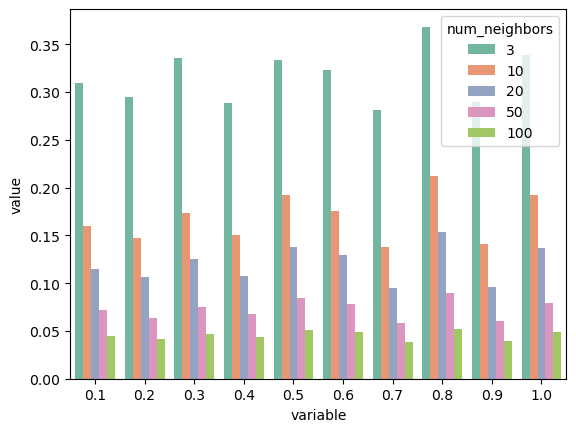

In [123]:
knn_eval_plot(out)